In [1]:
import datajoint as dj
dj.config['database.host'] = '10.86.1.219'
dj.config['database.user'] = 'root'
dj.config['database.password'] = 'retina'
dj.config["enable_python_native_blobs"] = True # Only for testing in dj0.12 (https://github.com/datajoint/datajoint-python#python-native-blobs)

%env DJ_SUPPORT_FILEPATH_MANAGEMENT=TRUE
import os
os.chdir('..')

import main
drive_path = r"U:\VEIDB/"
data_path = r"V:\Data"
ft = main.load(drive_path, data_path)

env: DJ_SUPPORT_FILEPATH_MANAGEMENT=TRUE
Connecting root@10.86.1.219:3306


In [2]:
from datetime import date
import numpy as np
from scipy.signal import convolve, medfilt
from scipy import ndimage
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sb
sb.set_style('white')

In [3]:
# Import local Neuron project
import sys
projects_folder = r'C:\Users\bramn\Documents\Projects'
if os.path.abspath(projects_folder) not in sys.path:
    sys.path.append(os.path.abspath(projects_folder))

import Neuron
from Neuron.datatypes.block import Block
from Neuron.visualization import spikes as vis_spikes
from ephys.neuropixels_utils import get_ap_analog

In [4]:
exp_table = ft.Experiment()
sess_table = ft.Session()
mouse_table = ft.Mouse()
subsess_table = ft.Subsession()
raw_table = ft.ephys_tables.EphysRaw()
raw_table_helper = ft.ephys_tables.EphysRawHelper()
subsess_events_table = ft.event_tables.SubsessionEvents()
subsess_spikes_table = ft.ephys_tables.SubsessionSpikes()
trial_events_table = ft.event_tables.TrialEvents()

sorted_table = ft.ephys_tables.SpikeSorted()
lfp_table = ft.ephys_tables.LFP()
opto_table = ft.event_tables.OptoEvents()

In [89]:
""" Parameters """
# exp, sess, subsess = '01588', '20211020', '0017_OPTS_0004'
# exp, sess, subsess = '01588', '20211022', '0014_OPTS_0002'
# exp, sess, subsess = '01589', '20211020', '0016_OPTS_0001'
# exp, sess, subsess = '01589', '20211022', '0013_OPTS_0001'
exp, sess, subsess = '01590', '20211022', '0013_OPTS_0001'
ap_path = os.path.join(data_path, (raw_table & {'experiment_id': exp, 'session_id': sess, 'subsession_id': subsess}).fetch1('ap_path'))
binFullPath = Path(ap_path)

mean_waveform_subsess_id = '0003_EXPA_0001'
mean_waveform_ap_path = os.path.join(data_path, (raw_table & {'experiment_id': exp, 'session_id': sess, 'subsession_id': mean_waveform_subsess_id}).fetch1('ap_path'))
mean_waveform_binFullPath = Path(mean_waveform_ap_path)


figures_folder = os.path.join(r"C:\Users\bramn\Documents\Projects\DatajointVEIDB\images", f"optotagging_{exp}_{sess}")
if not os.path.isdir(figures_folder):
    os.mkdir(figures_folder)

# Raw visualizations
window = [-10, 40] # in ms
flattened = True

# Opto-tagging detection
opto_window = [15, 450]
base_window = [-1500, -15] # base_window[0] should be negative!
response_prob_window = [15, 180]
avg_response_time_window = [15, 450]
evoked_rate_window = [15, 450]
peak_firing_rate_window = [15, 450]

def filter_opto(opto_metrics_df):
    # (opto_metrics_df['response_prob']>0.25) & (opto_metrics_df['avg_response_time']<150)
    return (opto_metrics_df['response_prob']>0.5)

In [90]:
subsess_table & {'experiment_id': '01588', 'type': 'OPTS'}

experiment_id,mouse_id,session_id,subsession_id,type,iteration
01588,M01,20211020,0015_OPTS_0002,OPTS,15
01588,M01,20211020,0016_OPTS_0003,OPTS,16
01588,M01,20211020,0017_OPTS_0004,OPTS,17
01588,M01,20211022,0013_OPTS_0001,OPTS,13
01588,M01,20211022,0014_OPTS_0002,OPTS,14


### Load data

In [91]:
sync_trace = (raw_table & {'experiment_id': exp, 'session_id': sess, 'subsession_id': subsess}).fetch1('sync_trace')
unit_info, units = (subsess_spikes_table & {'experiment_id': exp, 'session_id': sess, 'subsession_id': subsess}).fetch1('cluster_info', 'clusters')
block = Block(units_dict=units, unit_info=unit_info).annot_slice(annot='good')
pulse_starts, pulse_ends = (opto_table & {'experiment_id': exp, 'session_id': sess, 'subsession_id': subsess}).fetch1('pulse_starts', 'pulse_ends')
# mean_waveforms = np.load(fr"V:\Data\01588\neuropixel\20211022\sorted\mean_waveforms.npy")

# if flattened:
#     pulse_starts = [[t for trial in trials for t in trial[::2]]] # Get event starts
# else:
#     pulse_starts = [trial[::2] for trial in trials]
pulse_starts = np.reshape(pulse_starts, (-1, 10))*30000/2500
pulse_ends = np.reshape(pulse_ends, (-1, 10))*30000/2500
pulse_blocks = []
for trial_pulse_starts in pulse_starts:
    trial_pulse_blocks = []
    for start in trial_pulse_starts:
        pulse_block = block.time_slice(start/30+window[0], start/30+window[1])
        trial_pulse_blocks.append(pulse_block)
    pulse_blocks.append(trial_pulse_blocks)

In [92]:
np.diff(pulse_starts)

array([[ 6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,
         6000.],
       [ 6000.,  6000.,  6012.,  6000.,  6000.,  6000.,  6000.,  6000.,
         6000.],
       [ 6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,
         6000.],
       [  948., 11064.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,
         6000.],
       [ 6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,
         6000.],
       [ 6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6012.,  6000.,
         6000.],
       [ 6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,
         6000.],
       [ 6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,
         6000.],
       [ 6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,
         6000.],
       [ 6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,
         6000.]])

In [93]:
np.diff(pulse_starts)

array([[ 6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,
         6000.],
       [ 6000.,  6000.,  6012.,  6000.,  6000.,  6000.,  6000.,  6000.,
         6000.],
       [ 6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,
         6000.],
       [  948., 11064.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,
         6000.],
       [ 6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,
         6000.],
       [ 6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6012.,  6000.,
         6000.],
       [ 6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,
         6000.],
       [ 6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,
         6000.],
       [ 6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,
         6000.],
       [ 6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,  6000.,
         6000.]])

### Visualize raw data

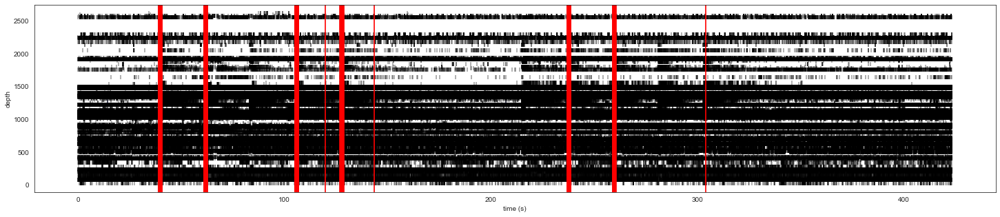

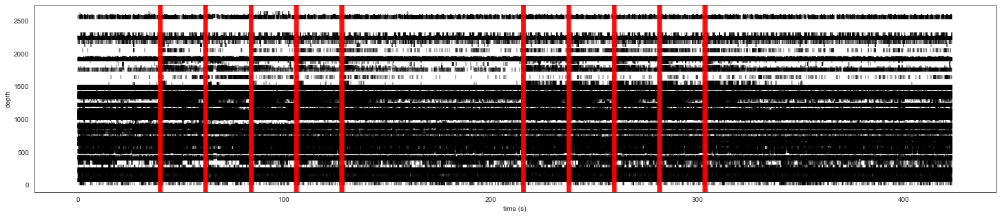

In [94]:
fig, ax = plt.subplots(1, 1, figsize=(25, 5))
vis_spikes.plot_raster(block, ax, event_times=np.where(np.diff(medfilt(sync_trace[1], 1)) != 0)[0]) # , event_times=pulse_starts
plt.savefig('defaultdiff.png', dpi=150)
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(25, 5))
vis_spikes.plot_raster(block, ax, event_times=pulse_starts.flatten()) # , event_times=pulse_starts
plt.savefig('artifactdetection.png', dpi=150)
plt.show()

In [95]:
spike_tensor_short = [block.get_spikes_matrix(end=30*(window[1]-window[0])) for trial_blocks in pulse_blocks[:5] for block in trial_blocks]
spike_tensor_long = [block.get_spikes_matrix(end=30*(window[1]-window[0])) for trial_blocks in pulse_blocks[5:] for block in trial_blocks]
spike_tensor = np.concatenate([spike_tensor_short, spike_tensor_long])

C:\Users\bramn\Documents\Projects\Neuron\datatypes\block.py:49: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(view)


1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500
1500 1500


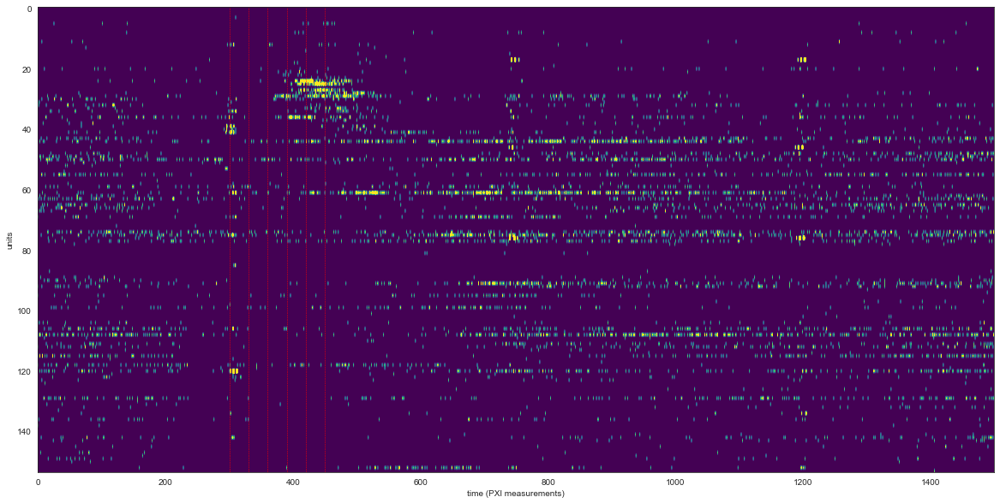

In [96]:
fig, axs = plt.subplots(1, 1, figsize=(20, 10))
axs.imshow(np.mean(np.array(spike_tensor)[:], axis=0)[::-1], aspect='auto', cmap='viridis', vmax=0.01)
# sb.heatmap(np.mean(spike_tensor, axis=0), ax=axs)
# axs.axvline(120, c='r')
# axs.axvline(150, c='r')
axs.set(xlabel='time (PXI measurements)', ylabel='units')
axs.axvline(-window[0]*30, c='r', linestyle='--', linewidth=0.5)
axs.axvline(-window[0]*30+30*1, c='r', linestyle='--', linewidth=0.5)
axs.axvline(-window[0]*30+30*2, c='r', linestyle='--', linewidth=0.5)
axs.axvline(-window[0]*30+30*3, c='r', linestyle='--', linewidth=0.5)
axs.axvline(-window[0]*30+30*4, c='r', linestyle='--', linewidth=0.5)
axs.axvline(-window[0]*30+30*5, c='r', linestyle='--', linewidth=0.5)
# plt.savefig(os.path.join(figures_folder, 'mean_spiketensor.png'))
plt.show()
# Order this plot by depth
# Increase in firing rate in first 5 ms compared to baseline

In [97]:
def get_opto_metrics(unit, opto_events, base_window, response_prob_window, avg_response_time_window, evoked_rate_window, peak_firing_rate_window):
    spike_times = unit.views['spikes'].astype('uint32')
    opto_events = opto_events.flatten().astype('uint32')
    
    if isinstance(spike_times, np.uint32) or len(spike_times) == 0:
        print("Can't calculate opto metrics as unit did not spike (or only spiked once):", spike_times)
        return {'avg_response_time': -1, 'response_prob': 0.0, 'evoked_rate': 0.0}
    spikes = np.zeros(max(opto_events[-1]+30*30, # Last interesting spike
                          spike_times[-1])+1)
#                            base_window[-1], 
#                            response_prob_window[-1], 
#                            avg_response_time_window[-1],
#                            evoked_rate_window[-1],
#                            peak_firing_rate_window[-1])-base_window[0]+1)
    spikes[spike_times] = 1
    
    base_matrix = np.zeros(shape=(len(opto_events), base_window[1]-base_window[0]))
    spikes_matrix = np.zeros(shape=(len(opto_events), max(response_prob_window[-1], 
                                                          avg_response_time_window[-1],
                                                          evoked_rate_window[-1],
                                                          peak_firing_rate_window[-1])))
#     spikes_matrix = np.zeros(shape=(len(opto_events),len(spikes))) # Take earliest of base_window and latest of opto_window
    for i, start in enumerate(opto_events):
#         print(start+base_window[0], start+base_window[1], len(spikes))
        base_matrix[i] = spikes[start+base_window[0]:start+base_window[1]]
        spikes_matrix[i] = spikes[start:start+spikes_matrix.shape[1]]
    
    # Average response time
    first_trial_responses = [np.where(trial)[0][0] for trial in spikes_matrix[:,avg_response_time_window[0]:avg_response_time_window[1]] if np.any(trial)]
    if len(first_trial_responses) != 0:
        avg_response_time = (np.mean(first_trial_responses)+avg_response_time_window[0])/30 # only includes spiketimes within timewindow
    else:
        avg_response_time = -1
        
    # Response probability TODO: only take into account the first 5 ms
    opto_spiketimes = np.where(spikes_matrix[:,response_prob_window[0]:response_prob_window[1]])
    trials_with_response = np.unique(opto_spiketimes[0])
    response_prob = len(trials_with_response)/spikes_matrix.shape[0]
    
    # Evoked firing rate
    base_mean = np.mean(base_matrix, axis=1) # Average along time
    opto_mean = np.mean(spikes_matrix[:,evoked_rate_window[0]:evoked_rate_window[1]], axis=1)
    evoked_rate = np.mean(opto_mean - base_mean)*30000/(evoked_rate_window[1]-evoked_rate_window[0]) # also possible to divide!
    
    # Peak firing rate
    firing_rates = (np.array([convolve(trial, np.ones(30*5), 'same') for trial in spikes_matrix[:,peak_firing_rate_window[0]:peak_firing_rate_window[1]]]).T-base_mean).T
    peak_firing_rate = np.mean(np.max(firing_rates, axis=1))*30000/(peak_firing_rate_window[1]-peak_firing_rate_window[0])
    
    return {'avg_response_time': avg_response_time, 'response_prob': response_prob, 'evoked_rate': evoked_rate, 'peak_rate': peak_firing_rate}

opto_metrics = {}
for u_id in block.units:
    opto_metrics[u_id] = get_opto_metrics(block[u_id.item()], pulse_starts, base_window, response_prob_window, avg_response_time_window, evoked_rate_window, peak_firing_rate_window)

Can't calculate opto metrics as unit did not spike (or only spiked once): []
Can't calculate opto metrics as unit did not spike (or only spiked once): []
Can't calculate opto metrics as unit did not spike (or only spiked once): []
Can't calculate opto metrics as unit did not spike (or only spiked once): []
Can't calculate opto metrics as unit did not spike (or only spiked once): []
Can't calculate opto metrics as unit did not spike (or only spiked once): []


In [98]:
opto_metrics

{8: {'avg_response_time': 10.988888888888889,
  'response_prob': 0.0,
  'evoked_rate': -0.06072616774162552,
  'peak_rate': 2.0034831069313834},
 17: {'avg_response_time': -1,
  'response_prob': 0.0,
  'evoked_rate': 0.0,
  'peak_rate': 0.0},
 22: {'avg_response_time': 4.45,
  'response_prob': 0.01,
  'evoked_rate': -0.0033309712263338907,
  'peak_rate': 1.3728085452223384},
 25: {'avg_response_time': 7.894117647058823,
  'response_prob': 0.02,
  'evoked_rate': -0.09116932303614826,
  'peak_rate': 12.289330082433532},
 26: {'avg_response_time': -1,
  'response_prob': 0.0,
  'evoked_rate': 0.0,
  'peak_rate': 0.0},
 32: {'avg_response_time': 6.67037037037037,
  'response_prob': 0.2,
  'evoked_rate': 0.004884356846306901,
  'peak_rate': 32.336235922442825},
 35: {'avg_response_time': 8.233333333333333,
  'response_prob': 0.0,
  'evoked_rate': -0.1598385760098007,
  'peak_rate': 1.2163009404388716},
 37: {'avg_response_time': -1,
  'response_prob': 0.0,
  'evoked_rate': -0.007895042377800

In [99]:
feature_matrix = np.zeros((len(opto_metrics), 4))

for i, (u_id, features) in enumerate(opto_metrics.items()):
    for j, (feature, value) in enumerate(features.items()):
        feature_matrix[i,j] = value


In [100]:
opto_metrics_df = pd.DataFrame.from_dict(opto_metrics).T

In [101]:
""" Define opto-tagged neurons """
# opto_metrics_df['tagged'] = (opto_metrics_df['response_prob']>0.25) & (opto_metrics_df['avg_response_time']<150)
opto_metrics_df['tagged'] = filter_opto(opto_metrics_df)
opto_units = opto_metrics_df[opto_metrics_df['tagged']==True].index

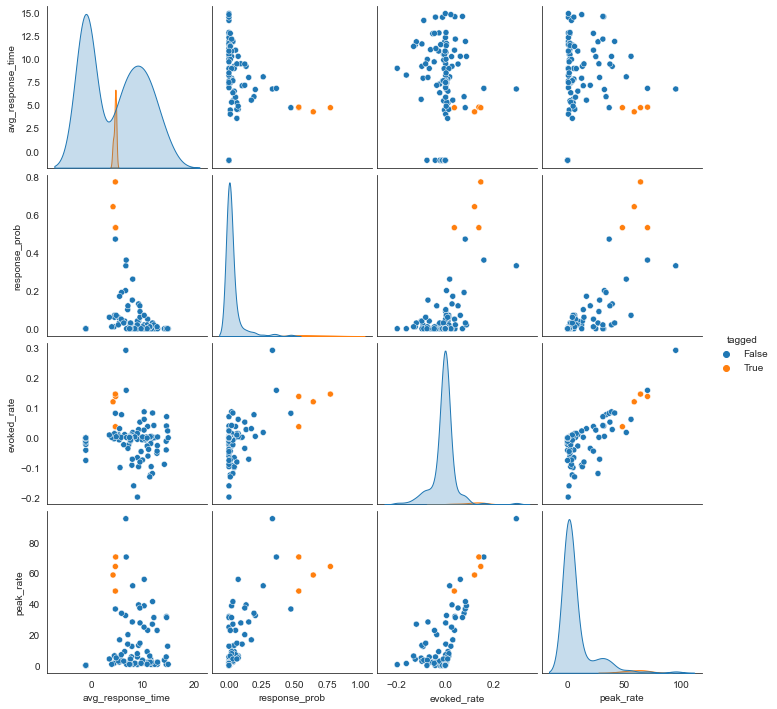

In [102]:
sb.pairplot(opto_metrics_df, hue='tagged')
plt.savefig(os.path.join(figures_folder, 'opto_metrics.svg'), dpi=200)


In [103]:
opto_metrics_df.to_csv(os.path.join(figures_folder, 'opto_metrics.csv'))

In [104]:
opto_units

Int64Index([1168, 1306, 1322, 1330], dtype='int64')

nChan: 385, nFileSamp: 12702456
1168698 1169208


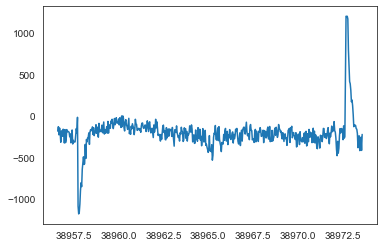

nChan: 385, nFileSamp: 12702456
1198698 1199208


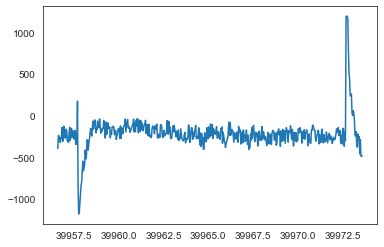

nChan: 385, nFileSamp: 12702456
1828698 1829208


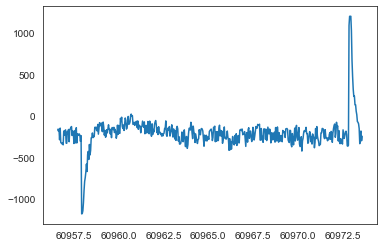

nChan: 385, nFileSamp: 12702456
1858710 1859220


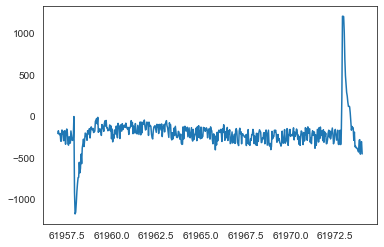

nChan: 385, nFileSamp: 12702456
2488710 2489220


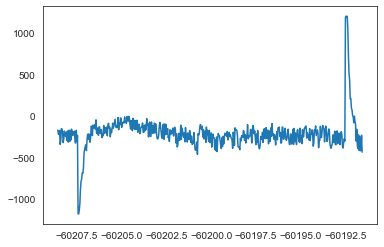

nChan: 385, nFileSamp: 12702456
2518710 2519220


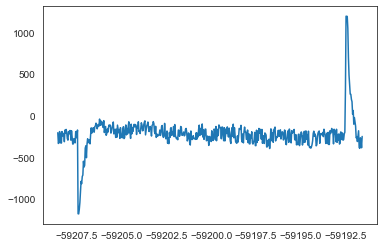

nChan: 385, nFileSamp: 12702456
3148710 3149220


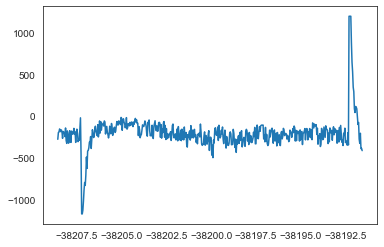

nChan: 385, nFileSamp: 12702456
3178722 3179232


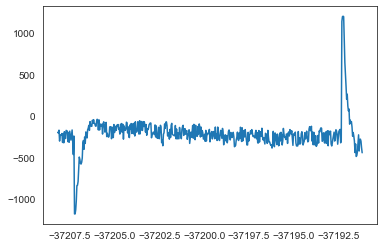

nChan: 385, nFileSamp: 12702456
3808722 3809232


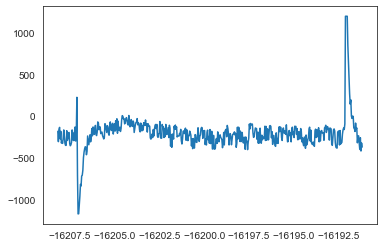

nChan: 385, nFileSamp: 12702456
3838722 3839232


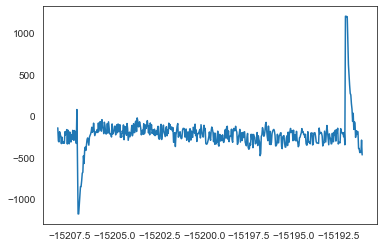

nChan: 385, nFileSamp: 12702456
6447114 6447624


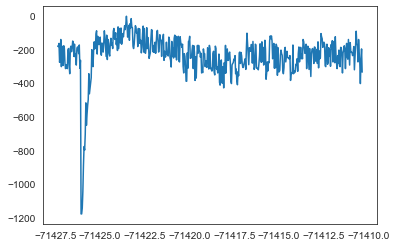

nChan: 385, nFileSamp: 12702456
6477114 6477624


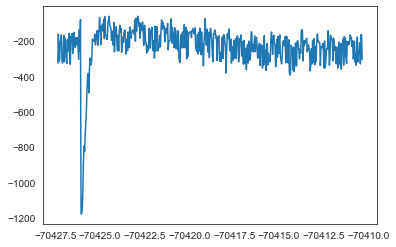

nChan: 385, nFileSamp: 12702456
7107126 7107636


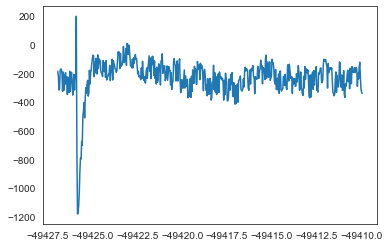

nChan: 385, nFileSamp: 12702456
7137126 7137636


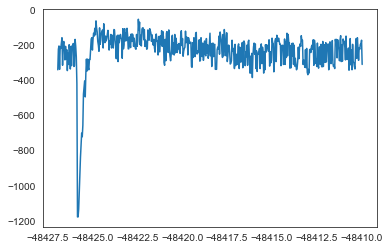

nChan: 385, nFileSamp: 12702456
7767126 7767636


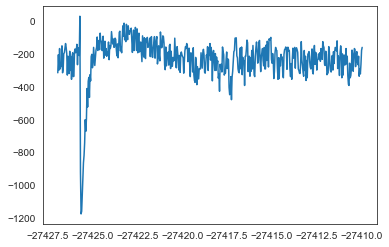

nChan: 385, nFileSamp: 12702456
7797126 7797636


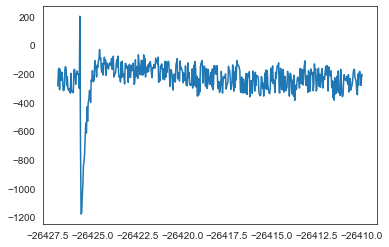

nChan: 385, nFileSamp: 12702456
8427138 8427648


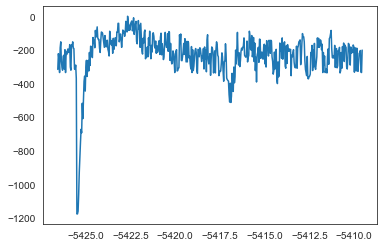

nChan: 385, nFileSamp: 12702456
8457138 8457648


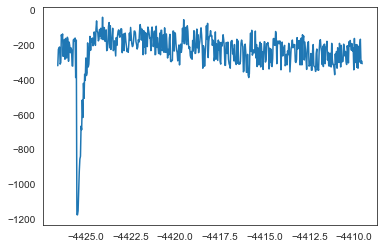

nChan: 385, nFileSamp: 12702456
9087138 9087648


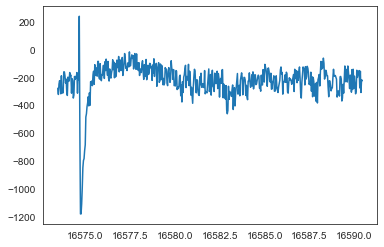

nChan: 385, nFileSamp: 12702456
9117138 9117648


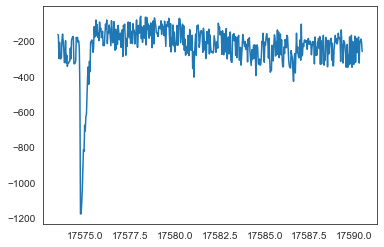

In [105]:
analogs = []
for pulse_start in pulse_starts.flatten()[::5]:
    analogs.append(get_ap_analog(binFullPath, int(pulse_start), int(pulse_start+15*30), window=[-30, 30]))

C:\Users\bramn\Documents\Projects\DatajointVEIDB\images\optotagging_01590_20211022\1168_1800


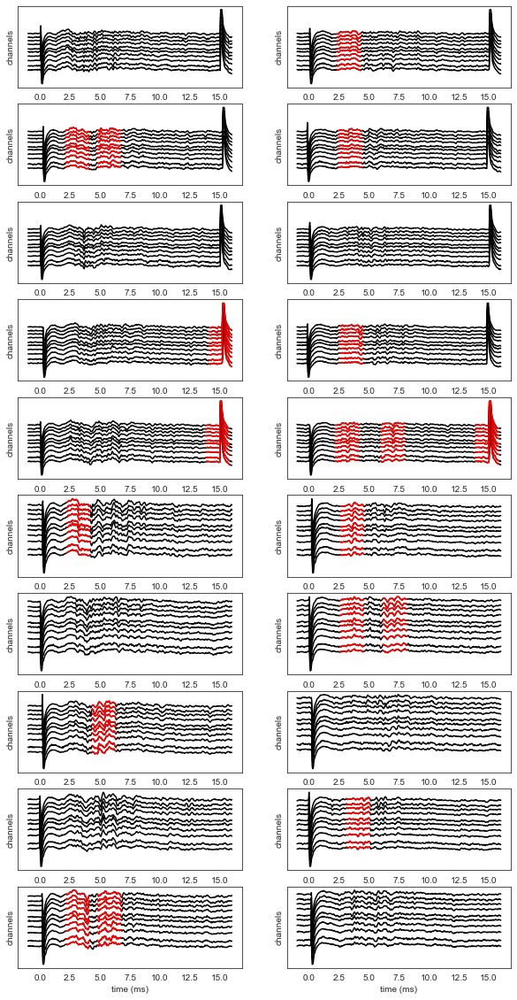

C:\Users\bramn\Documents\Projects\DatajointVEIDB\images\optotagging_01590_20211022\1306_2060


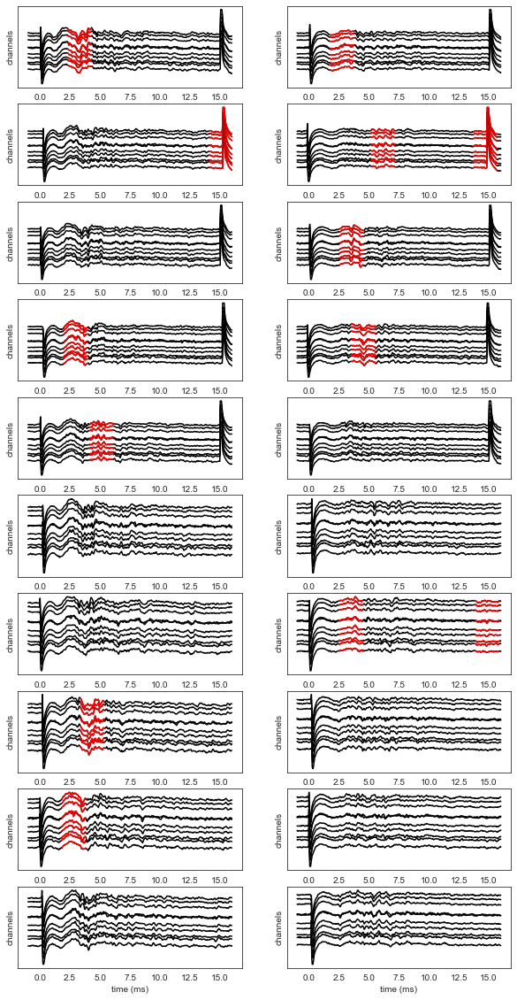

C:\Users\bramn\Documents\Projects\DatajointVEIDB\images\optotagging_01590_20211022\1322_2140


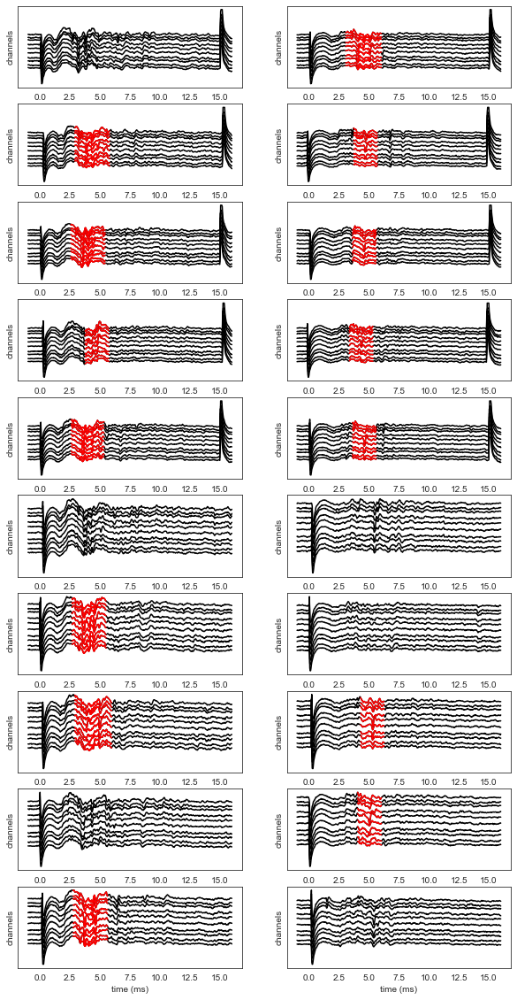

C:\Users\bramn\Documents\Projects\DatajointVEIDB\images\optotagging_01590_20211022\1330_2180


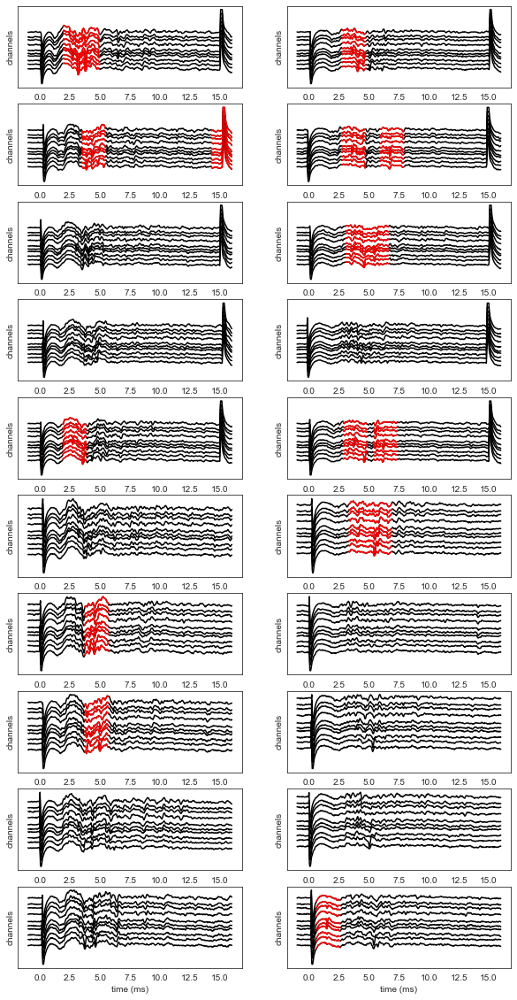

In [106]:
for u_id in opto_units:
    unit_path = os.path.join(figures_folder, f'{u_id}_{int(block.units[u_id].unit_info["depth"])}')
    if not os.path.isdir(unit_path):
        os.mkdir(unit_path)
    print(unit_path)
    fig, axs = plt.subplots(10, 2, figsize=(10, 20))
    for idx, (pulse_start, analog) in enumerate(zip(pulse_starts.flatten()[::5], analogs)):
        opto_unit = block.units[u_id]
        u_channel = opto_unit.unit_info['ch']
        u_spikes = block.units[u_id].time_slice(pulse_start/30-1, pulse_start/30+16).views['spikes'].astype('uint32')

        for i, row in enumerate(analog[u_channel-5:u_channel+5,:]):
#             print(u_channel)
#             print(i, len(row))
            axs[idx//2,idx%2].plot((np.arange(0, len(row))-30)/30, (row*2+(i*500)), 'k')
            for spike in u_spikes:
#                 print(spike)
                axs[idx//2,idx%2].plot((np.arange(max(0, spike-30), min(len(row), spike+30))-30)/30, (row[max(0,spike-30):spike+30]*2+(i*500)), 'r')
        #     ax.axvline(18178429-(18178429-30*1), c='k', linewidth=2)
        #     ax.axvline(0, c='k', linewidth=2)
        #     ax.axvline((lastSamp-30-firstSamp-before)/30, c='k', linewidth=2)
            axs[idx//2,idx%2].set(xlabel='time (ms)', ylabel='channels', yticks=[]) # , xlim=[-1, 2]
    plt.savefig(os.path.join(unit_path, f'opto_high_sync_{u_id}.svg'), dpi=200)

    plt.show()

C:\Users\bramn\Documents\Projects\DatajointVEIDB\images\optotagging_01590_20211022\1168_1800


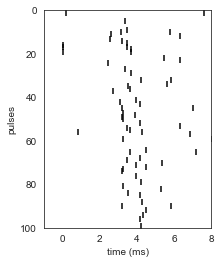

C:\Users\bramn\Documents\Projects\DatajointVEIDB\images\optotagging_01590_20211022\1306_2060


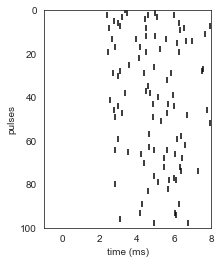

C:\Users\bramn\Documents\Projects\DatajointVEIDB\images\optotagging_01590_20211022\1322_2140


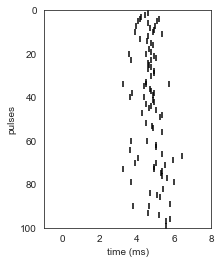

C:\Users\bramn\Documents\Projects\DatajointVEIDB\images\optotagging_01590_20211022\1330_2180


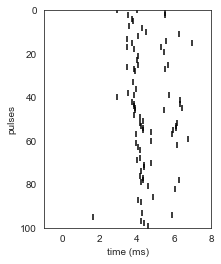

In [107]:
""" Raster plots for each unit """
for u_id in opto_units:
    unit_path = os.path.join(figures_folder, f'{u_id}_{int(block.units[u_id].unit_info["depth"])}')
    if not os.path.isdir(unit_path):
        os.mkdir(unit_path)
    print(unit_path)
    fig, axs = plt.subplots(1, 1, figsize=(3, 4))
    
    unit = block[u_id]
    for i, start in enumerate((pulse_starts.flatten())):
#         print(unit.views['spikes'][-1], start)
        pulse_spikes = unit.time_slice(start/30, start/30+10).views['spikes'].astype('uint32')
        axs.scatter(np.array(pulse_spikes)/30, np.ones_like(pulse_spikes)*i, marker='|', c=[(0, 0, 0, 1)])
    axs.set(ylim=[0, 100], xlim=[-1, 8], xlabel='time (ms)', ylabel='pulses')
    plt.gca().invert_yaxis()
    plt.savefig(os.path.join(unit_path, f'rasterplot_{u_id}.svg'), dpi=200)
    plt.show()

C:\Users\bramn\Documents\Projects\DatajointVEIDB\images\optotagging_01590_20211022\1168_1800
(1446,)
nChan: 385, nFileSamp: 6793200
14866 14926


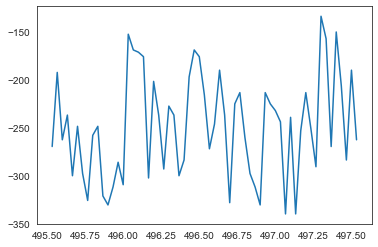

(20, 61)
nChan: 385, nFileSamp: 6793200
210967 211027


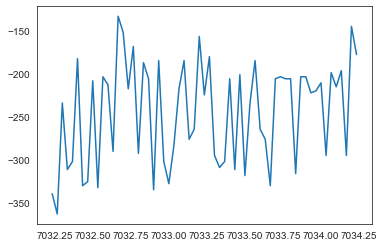

(20, 61)
nChan: 385, nFileSamp: 6793200
472557 472617


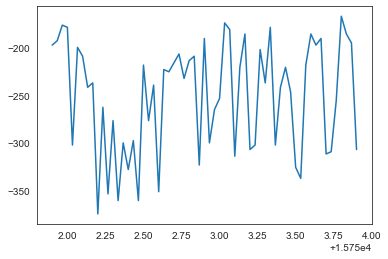

(20, 61)
nChan: 385, nFileSamp: 6793200
625158 625218


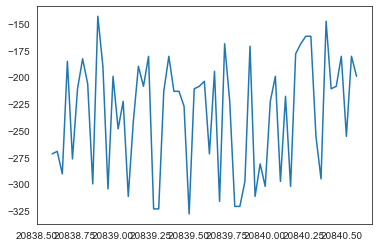

(20, 61)
nChan: 385, nFileSamp: 6793200
746443 746503


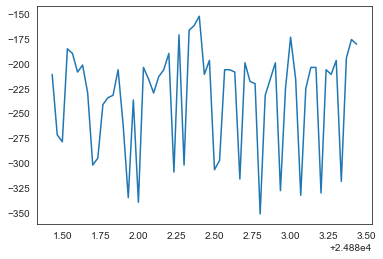

(20, 61)
nChan: 385, nFileSamp: 6793200
904478 904538


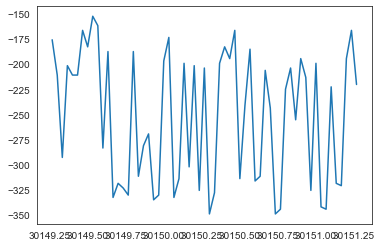

(20, 61)
nChan: 385, nFileSamp: 6793200
1045293 1045353


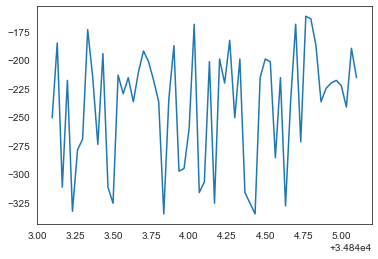

(20, 61)
nChan: 385, nFileSamp: 6793200
1224961 1225021


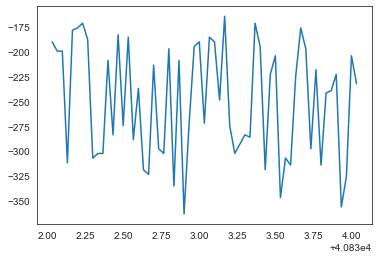

(20, 61)
nChan: 385, nFileSamp: 6793200
1477779 1477839


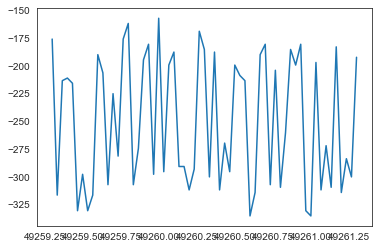

(20, 61)
nChan: 385, nFileSamp: 6793200
1903672 1903732


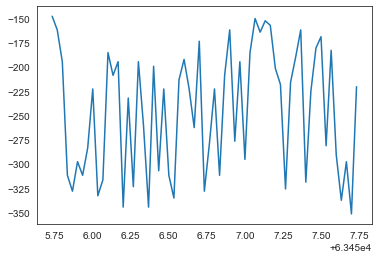

(20, 61)
nChan: 385, nFileSamp: 6793200
2435699 2435759


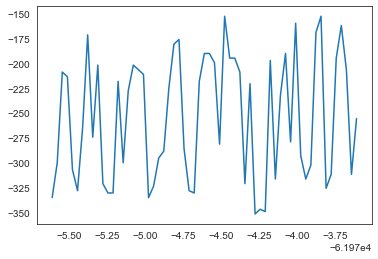

(20, 61)
nChan: 385, nFileSamp: 6793200
2931567 2931627


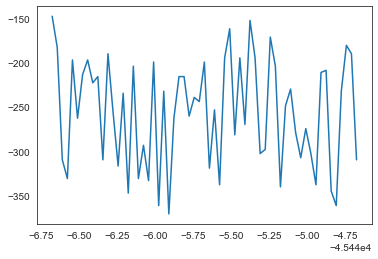

(20, 61)
nChan: 385, nFileSamp: 6793200
3729430 3729490


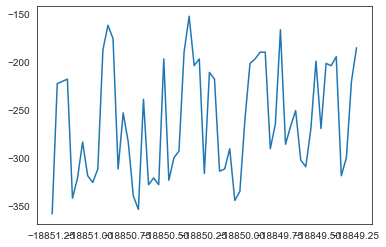

(20, 61)
nChan: 385, nFileSamp: 6793200
4549294 4549354


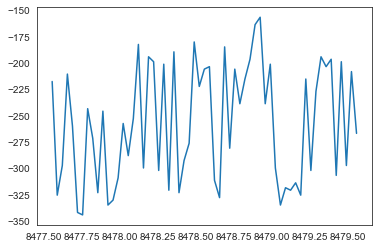

(20, 61)
nChan: 385, nFileSamp: 6793200
5801777 5801837


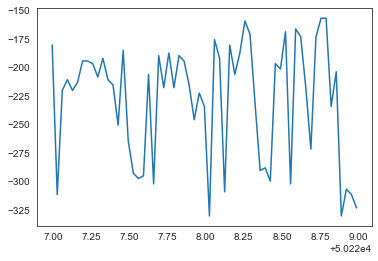

(20, 61)


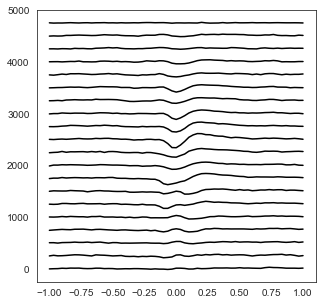

C:\Users\bramn\Documents\Projects\DatajointVEIDB\images\optotagging_01590_20211022\1306_2060
(2276,)
nChan: 385, nFileSamp: 6793200
36692 36752


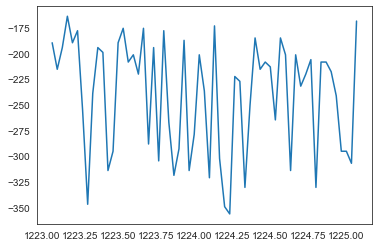

(20, 61)
nChan: 385, nFileSamp: 6793200
102491 102551


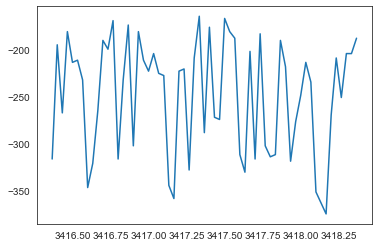

(20, 61)
nChan: 385, nFileSamp: 6793200
223502 223562


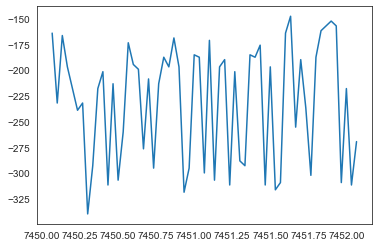

(20, 61)
nChan: 385, nFileSamp: 6793200
353077 353137


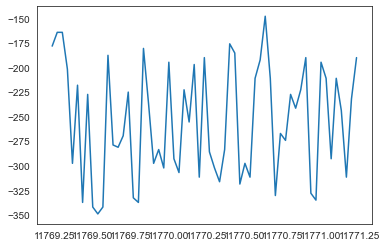

(20, 61)
nChan: 385, nFileSamp: 6793200
508618 508678


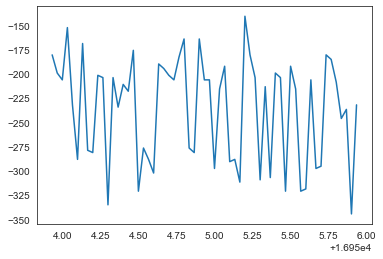

(20, 61)
nChan: 385, nFileSamp: 6793200
664675 664735


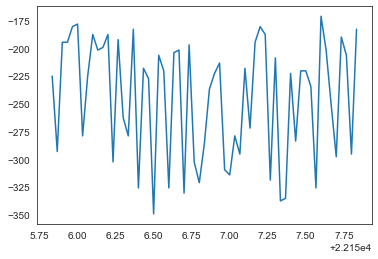

(20, 61)
nChan: 385, nFileSamp: 6793200
903792 903852


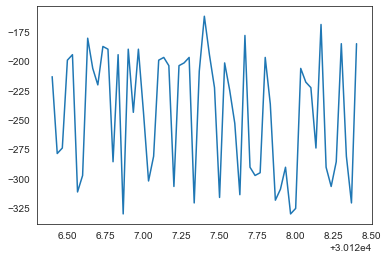

(20, 61)
nChan: 385, nFileSamp: 6793200
1056495 1056555


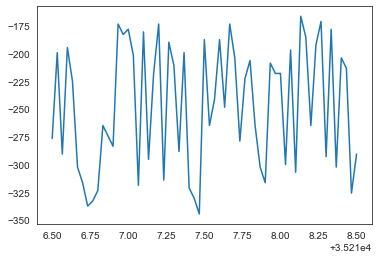

(20, 61)
nChan: 385, nFileSamp: 6793200
1211776 1211836


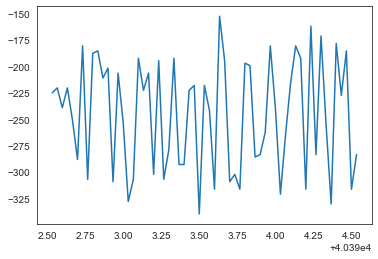

(20, 61)
nChan: 385, nFileSamp: 6793200
1467957 1468017


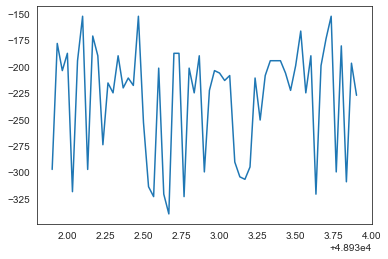

(20, 61)
nChan: 385, nFileSamp: 6793200
1739987 1740047


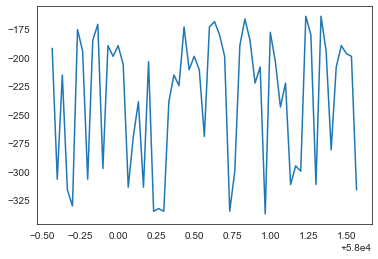

(20, 61)
nChan: 385, nFileSamp: 6793200
1910362 1910422


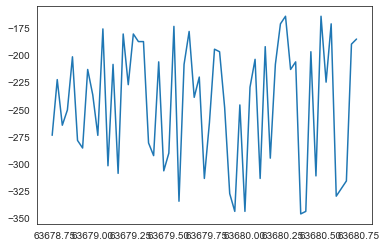

(20, 61)
nChan: 385, nFileSamp: 6793200
2209799 2209859


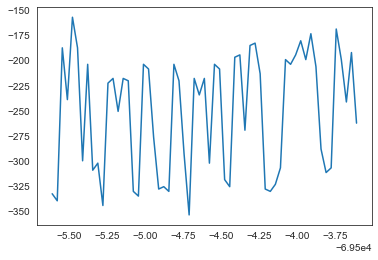

(20, 61)
nChan: 385, nFileSamp: 6793200
2509667 2509727


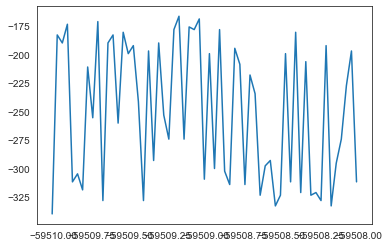

(20, 61)
nChan: 385, nFileSamp: 6793200
2778557 2778617


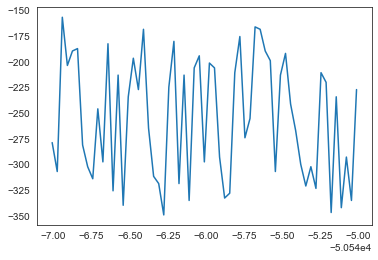

(20, 61)
nChan: 385, nFileSamp: 6793200
3063189 3063249


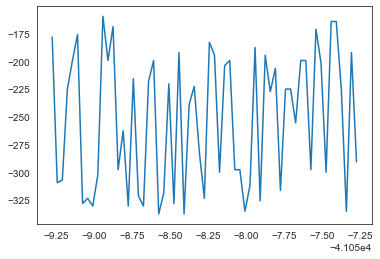

(20, 61)
nChan: 385, nFileSamp: 6793200
3416693 3416753


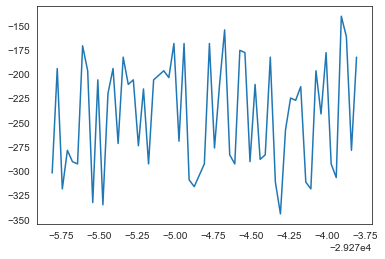

(20, 61)
nChan: 385, nFileSamp: 6793200
3781823 3781883


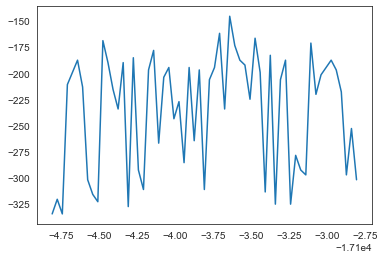

(20, 61)
nChan: 385, nFileSamp: 6793200
4153657 4153717


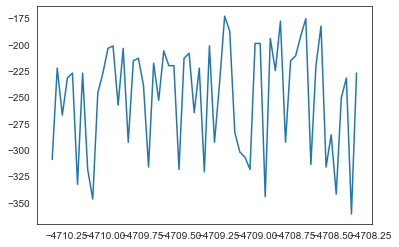

(20, 61)
nChan: 385, nFileSamp: 6793200
4532944 4533004


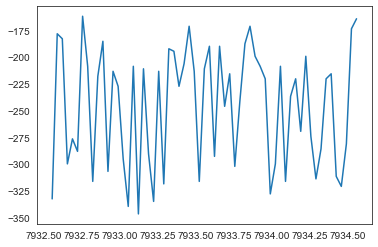

(20, 61)
nChan: 385, nFileSamp: 6793200
4840435 4840495


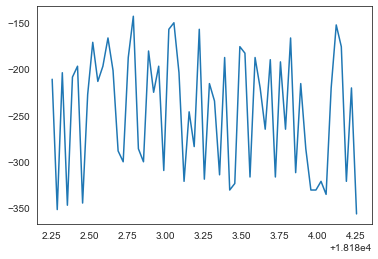

(20, 61)
nChan: 385, nFileSamp: 6793200
5379137 5379197


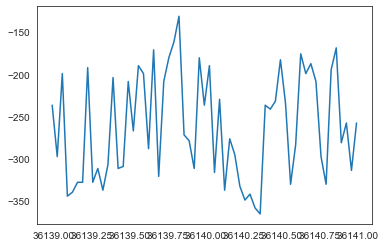

(20, 61)
nChan: 385, nFileSamp: 6793200
5834067 5834127


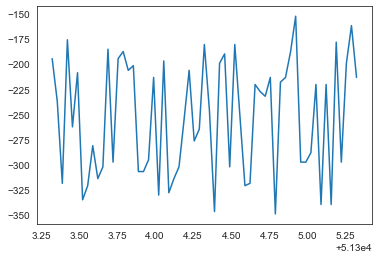

(20, 61)


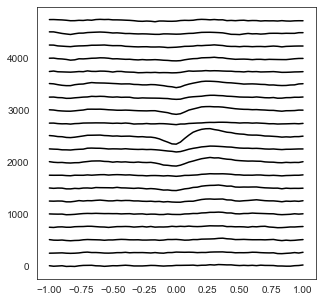

C:\Users\bramn\Documents\Projects\DatajointVEIDB\images\optotagging_01590_20211022\1322_2140
(2020,)
nChan: 385, nFileSamp: 6793200
66836 66896


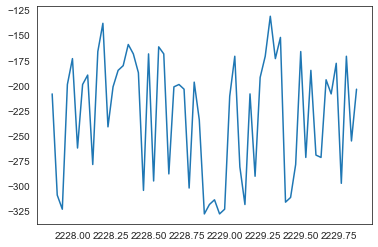

(20, 61)
nChan: 385, nFileSamp: 6793200
214442 214502


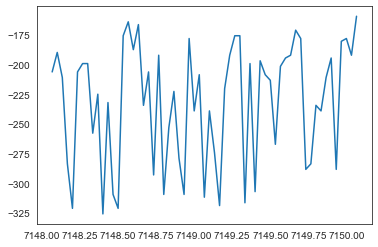

(20, 61)
nChan: 385, nFileSamp: 6793200
486438 486498


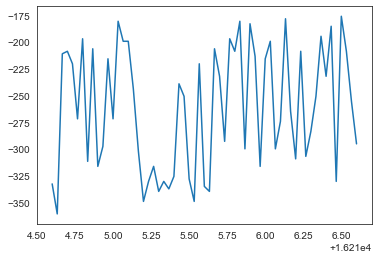

(20, 61)
nChan: 385, nFileSamp: 6793200
534084 534144


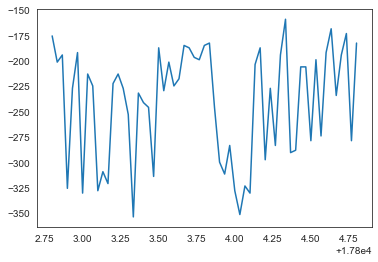

(20, 61)
nChan: 385, nFileSamp: 6793200
782052 782112


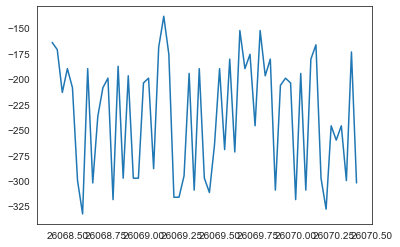

(20, 61)
nChan: 385, nFileSamp: 6793200
1041486 1041546


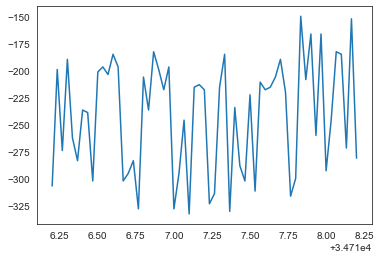

(20, 61)
nChan: 385, nFileSamp: 6793200
1207358 1207418


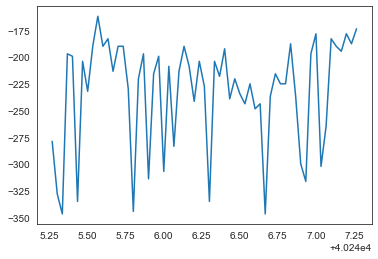

(20, 61)
nChan: 385, nFileSamp: 6793200
1463782 1463842


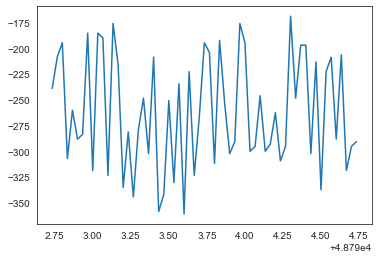

(20, 61)
nChan: 385, nFileSamp: 6793200
1617239 1617299


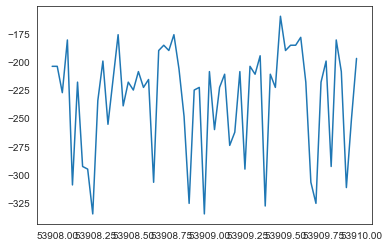

(20, 61)
nChan: 385, nFileSamp: 6793200
1896914 1896974


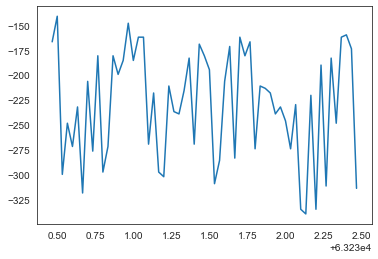

(20, 61)
nChan: 385, nFileSamp: 6793200
2060885 2060945


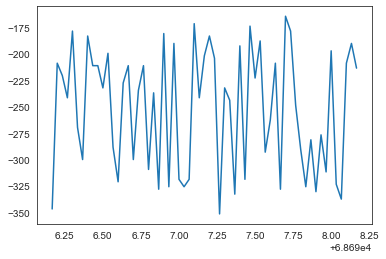

(20, 61)
nChan: 385, nFileSamp: 6793200
2351263 2351323


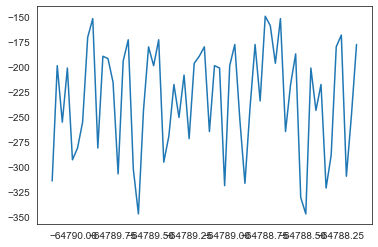

(20, 61)
nChan: 385, nFileSamp: 6793200
2761344 2761404


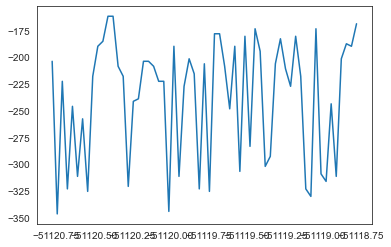

(20, 61)
nChan: 385, nFileSamp: 6793200
3051535 3051595


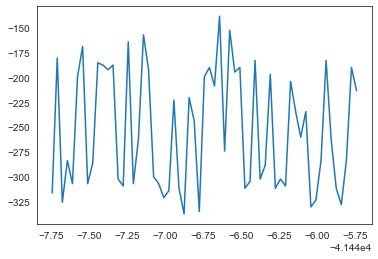

(20, 61)
nChan: 385, nFileSamp: 6793200
3226789 3226849


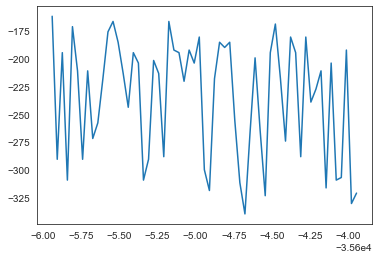

(20, 61)
nChan: 385, nFileSamp: 6793200
3532991 3533051


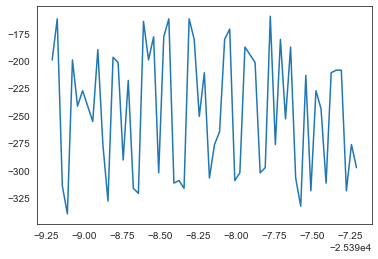

(20, 61)
nChan: 385, nFileSamp: 6793200
3963865 3963925


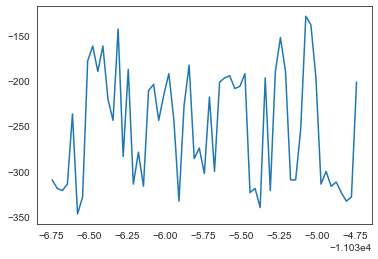

(20, 61)
nChan: 385, nFileSamp: 6793200
4413575 4413635


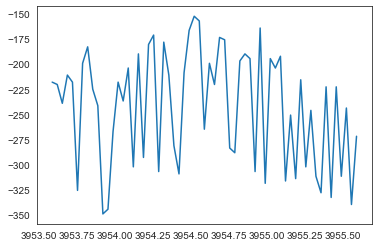

(20, 61)
nChan: 385, nFileSamp: 6793200
4859747 4859807


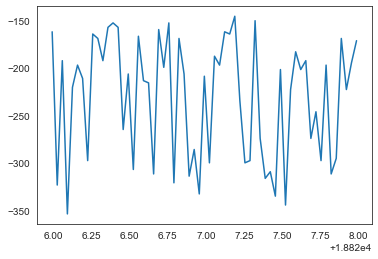

(20, 61)
nChan: 385, nFileSamp: 6793200
5233148 5233208


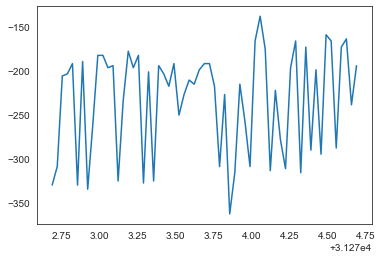

(20, 61)
nChan: 385, nFileSamp: 6793200
5686981 5687041


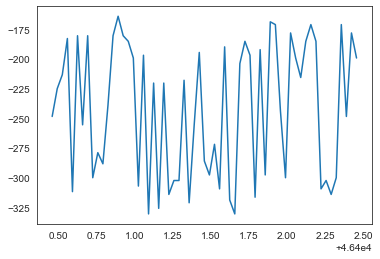

(20, 61)


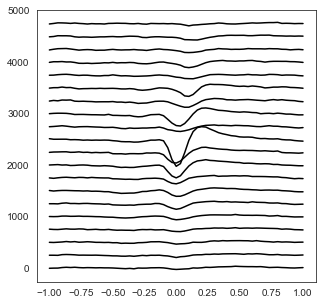

C:\Users\bramn\Documents\Projects\DatajointVEIDB\images\optotagging_01590_20211022\1330_2180
(2494,)
nChan: 385, nFileSamp: 6793200
-8 52


ValueError: x and y must have same first dimension, but have shapes (61,) and (0,)

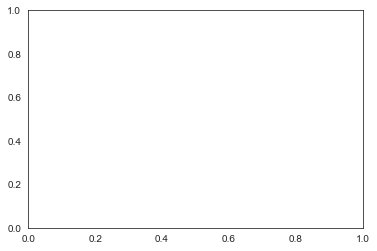

In [108]:
""" Calculate mean waveform """
mean_waveforms = {}
for u_id in opto_units:
    unit_path = os.path.join(figures_folder, f'{u_id}_{int(block.units[u_id].unit_info["depth"])}')
    if not os.path.isdir(unit_path):
        os.mkdir(unit_path)
    print(unit_path)
    
    curr = np.zeros(shape=(20, 61))
    clusters, cluster_info = (subsess_spikes_table & {'experiment_id': exp, 'session_id': sess, 'subsession_id': mean_waveform_subsess_id}).fetch1('clusters', 'cluster_info')
    u_spikes = clusters[u_id]
    print(u_spikes.shape)
    
    u_channel = cluster_info['ch'][u_id]
    for spike in u_spikes[::100]:
        analog = get_ap_analog(mean_waveform_binFullPath, int(spike-30), int(spike+30), window=[0, 0])[u_channel-10:u_channel+10]
        print(analog.shape)
        curr += analog
    curr /= len(u_spikes[::100])
    curr -= np.expand_dims(np.mean(curr[:,:5], axis=1), axis=-1)
    mean_waveforms[u_id] = curr
    
    fig, axs = plt.subplots(1, 1, figsize=(5, 5))
    for i, row in enumerate(curr):
        axs.plot((np.arange(0, len(row))-30)/30, (row*2+(i*250)), 'k')
    plt.savefig(os.path.join(unit_path, f'mean_waveform_{u_id}.svg'), dpi=200)
    plt.show()
#     break

# ------------------------------------------ END

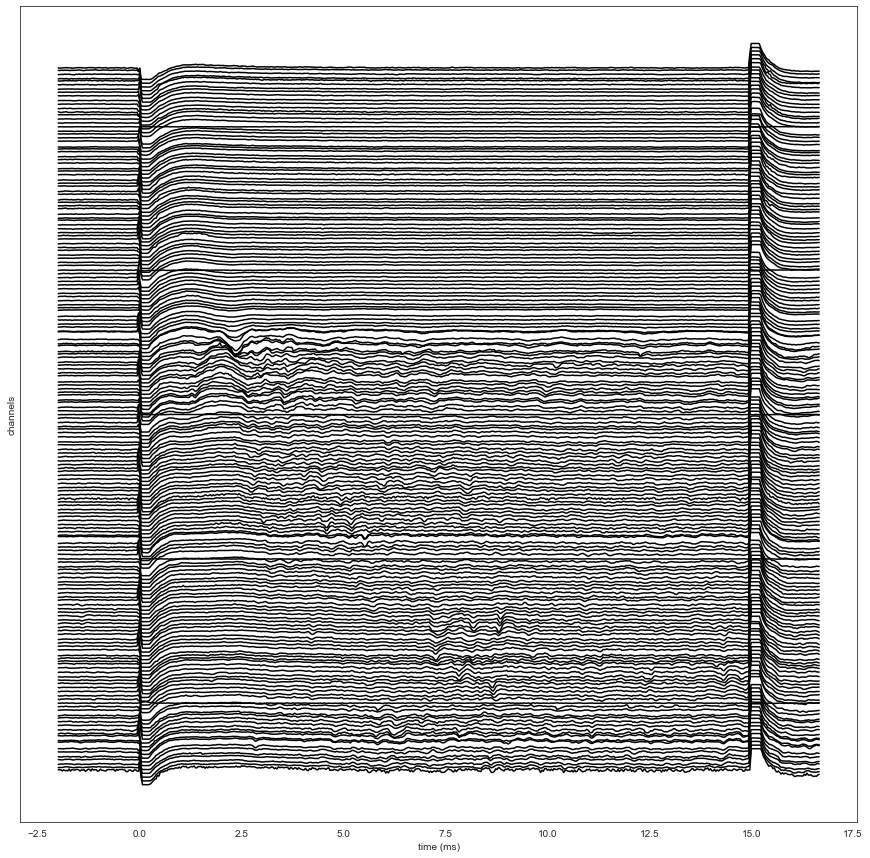

In [220]:
fig, ax = plt.subplots(1, 1, figsize=(15, 15))

for i, row in enumerate(convData[::2,:]):
    ax.plot((np.arange(0, len(row))-before)/30, (row*2+(i*500)), 'k')
#     ax.axvline(18178429-(18178429-30*1), c='k', linewidth=2)
#     ax.axvline(0, c='k', linewidth=2)
#     ax.axvline((lastSamp-30-firstSamp-before)/30, c='k', linewidth=2)
    ax.set(xlabel='time (ms)', ylabel='channels', yticks=[]) # , xlim=[-1, 2]
# plt.savefig('opto_high_sync.png', dpi=150)
plt.show()

In [167]:
print(f"Total number of units: {len(response_probs)}, candidates remaining: {len(opto_candidates)}")

Total number of units: 107, candidates remaining: 15


NameError: name 'cluster_idxs' is not defined

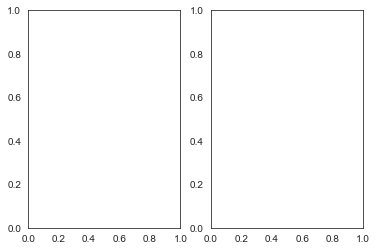

In [162]:
for i_unit in range(opto_cand_spikes.shape[1]):
    fig, axs = plt.subplots(1, 2)
    c = int(cluster_idxs[opto_candidates[i_unit]])
    c_depth = cluster_info['depth'][c]
#     axs.imshow(opto_candidates[:,i_unit,:])
    for j_trial in range(opto_cand_spikes.shape[0]):
        unit_spiketimes = np.where(opto_cand_spikes[j_trial, i_unit])[0]
        axs[0].scatter(unit_spiketimes/30, np.ones_like(unit_spiketimes)*j_trial, marker='.', c='k')
    axs[0].set_title(f"Unit {c} - depth: {c_depth}")
    axs[0].set_ylim(0, opto_cand_spikes.shape[0])
#     axs[0].set_xlim(0, 1)

    axs[0].set_xlim(0, 6)
    axs[0].axvline(4, c='r')
    
    axs[0].set(xlabel='time after pulse (ms)', ylabel='pulses')
    
    channel = cluster_info['ch'][c] # len(channel_map) - cluster_info['ch'][unit]
    n_channels = 30
    for i, row in enumerate(mean_waveforms[c,:,channel-n_channels//2:channel+n_channels//2].T): # check 203 -> nothing
    #     print("been here")
        axs[1].plot((np.arange(0, len(row)))/30, row+(i*500), 'k')
        axs[1].set(xlabel='time (ms)', ylabel='channels', yticks=[])
    
#     plt.savefig(os.path.join(figures_folder, f"{c_depth}_{c}.png"))
    plt.show()

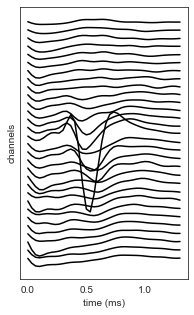

In [85]:
channel = cluster_info['ch'][4] # len(channel_map) - cluster_info['ch'][unit]
n_channels = 30

fig, ax = plt.subplots(1, 1, figsize=(3, 5))
for i, row in enumerate(mean_waveforms[4,:,channel-n_channels//2:channel+n_channels//2].T): # check 203 -> nothing
#     print("been here")
    ax.plot((np.arange(0, len(row)))/30, row+(i*500), 'k')
    ax.set(xlabel='time (ms)', ylabel='channels', yticks=[])
# plt.savefig('mean_waveform_unit203.png', dpi=150)
plt.show()

## OLD

In [60]:
np.diff(np.where(np.diff(sync_trace[1]) != 0)[0])

array([      1,   11999,       1,  648003,       1,       1,     374,
         11624,       1,       2,       2,    5995,       1,       1,
             1,  606001,     274,       1,       2,    5723,     277,
          5723,     277,    5724,     269,       1,       5,    5725,
           272,    5728,     271,    5729,     270,    5730,     271,
             1,       1,    5727,     268,       2,       1,    5729,
           271,  605733,     298,    5702,     300,    5700,     295,
             1,       3,    5701,     295,       1,       1,    5703,
           298,       1,       1,    5700,     298,    5702,     296,
          5704,     298,    5702,     300,    5700,     296, 1774617,
           331,    5669,     329,    5672,     327,    5673,     326,
          5674,     325,       1,       1,    5673,     327,    5673,
           327,    5673,     325,    5675,     326,    5674,     327,
       1265681,      63,    5937,      63,    5938,      64,    5936,
            64,    5

In [44]:
sync_trace.shape

(16, 12670080)

In [48]:
[np.diff(t)/30 for t in trials]

[array([12.5]),
 array([  9.2       , 190.8       ,   9.23333333, 190.76666667,
          9.23333333, 190.8       ,   9.13333333, 190.86666667,
          9.06666667, 190.93333333,   9.03333333, 190.96666667,
          9.        , 191.        ,   9.06666667, 190.93333333,
          8.96666667, 191.03333333,   9.03333333]),
 array([  9.93333333, 190.06666667,  10.        , 190.        ,
          9.93333333, 190.06666667,   9.86666667, 190.13333333,
          9.96666667, 190.03333333,   9.93333333, 190.06666667,
          9.86666667, 190.13333333,   9.93333333, 190.06666667,
         10.        , 190.        ,   9.86666667]),
 array([ 11.03333333, 188.96666667,  10.96666667, 189.06666667,
         10.9       , 189.1       ,  10.86666667, 189.13333333,
         10.86666667, 189.13333333,  10.9       , 189.1       ,
         10.9       , 189.1       ,  10.83333333, 189.16666667,
         10.86666667, 189.13333333,  10.9       ]),
 array([  2.1       , 197.9       ,   2.1       , 197.933333

In [10]:
key = {'experiment_id': '01588', 'session_id': '20211022', 'subsession_id': 'OPTS_0014'}
# key = {'experiment_id': '01231', 'session_id': '20200327a', 'subsession_id': 'OPTS_0001'}

sync_trace = (raw_table & key).fetch1('sync_trace')

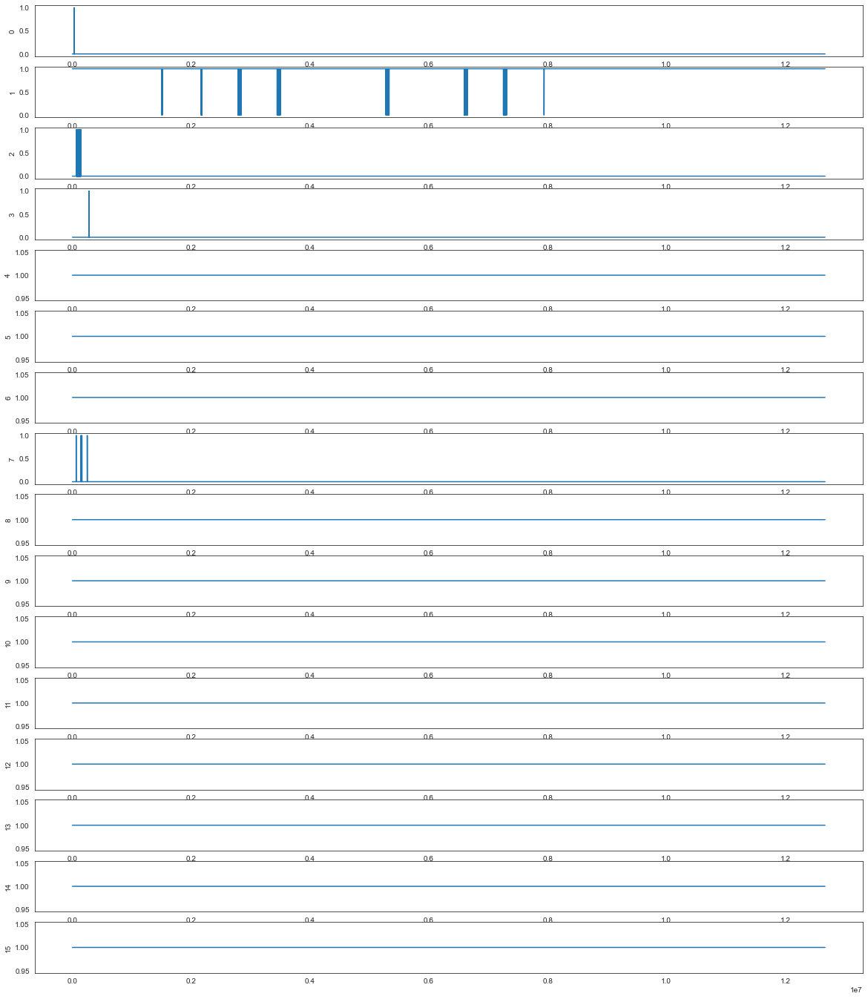

In [57]:
fig, axs = plt.subplots(16, 1, figsize=(20, 24))
for i, signal in enumerate(sync_trace):
#     axs[i].plot(signal[60000:1000000-930000])
    axs[i].plot(signal)
    axs[i].set_ylabel(i)
plt.show()

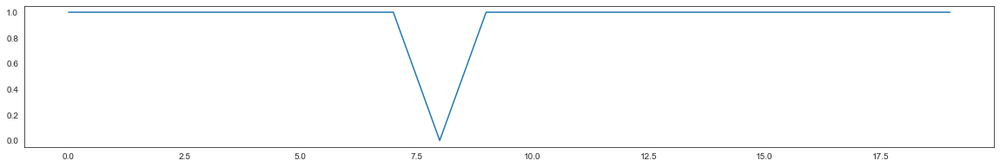

In [31]:
fig, axs = plt.subplots(1, 1, figsize=(20, 3))
axs.plot(sync_trace[1,1503050:1503070])
plt.show()

In [11]:
from scipy.signal import medfilt
# medfilt(sync_trace[1,:], kernel_size=5)
# np.diff(np.where(np.diff(medfilt(sync_trace[1,3430000:3520000], kernel_size=3))!=0)[0])
# np.diff(np.where(np.diff(medfilt(sync_trace[1,:], kernel_size=7))!=0)[0])

In [12]:
np.where(np.diff(medfilt(sync_trace[1,:], kernel_size=7))!=0)[0]

array([2163062, 2163437, 2787065, 2787341, 2793065, 2793342, 2799065,
       2799342, 2805066, 2805341, 2811066, 2811338, 2817066, 2817337,
       2823066, 2823336, 2829066, 2829338, 2835066, 2835335, 2841066,
       2841337, 3447070, 3447368, 3453070, 3453370, 3459070, 3459368,
       3465070, 3465366, 3471070, 3471369, 3477070, 3477368, 3483070,
       3483366, 3489070, 3489368, 3495070, 3495370, 3501070, 3501366,
       5275983, 5276314, 5281983, 5282312, 5287984, 5288311, 5293984,
       5294310, 5299984, 5300310, 5305984, 5306311, 5311984, 5312311,
       5317984, 5318309, 5323984, 5324310, 5329984, 5330311, 6595992,
       6596055, 6601992, 6602055, 6607993, 6608057, 6613993, 6614057,
       6619993, 6620059, 6625993, 6626061, 6631993, 6632062, 6637993,
       6638065, 6643993, 6644069, 6649993, 6650071, 7255997, 7256280,
       7261997, 7262278, 7267997, 7268285, 7273997, 7274285, 7279997,
       7280286, 7285997, 7286288, 7291997, 7292289, 7297997, 7298291,
       7303997, 7304

In [15]:
np.diff(np.where(np.diff(medfilt(sync_trace[1,:], kernel_size=7))!=0)[0])

array([    375,  623628,     276,    5724,     277,    5723,     277,
          5724,     275,    5725,     272,    5728,     271,    5729,
           270,    5730,     272,    5728,     269,    5731,     271,
        605733,     298,    5702,     300,    5700,     298,    5702,
           296,    5704,     299,    5701,     298,    5702,     296,
          5704,     298,    5702,     300,    5700,     296, 1774617,
           331,    5669,     329,    5672,     327,    5673,     326,
          5674,     326,    5674,     327,    5673,     327,    5673,
           325,    5675,     326,    5674,     327, 1265681,      63,
          5937,      63,    5938,      64,    5936,      64,    5936,
            66,    5934,      68,    5932,      69,    5931,      72,
          5928,      76,    5924,      78,  605926,     283,    5717,
           281,    5719,     288,    5712,     288,    5712,     289,
          5711,     291,    5709,     292,    5708,     294,    5706,
           296,    5

In [134]:
key = {'experiment_id': '01588', 'subsession_id': 'OPTS_0013'}
# key = {'experiment_id': '01231', 'subsession_id': 'OPTS_0001'}

trials = (subsess_events_table & key).fetch1('trials')
sync_trace = (raw_table & key).fetch1('sync_trace')

In [135]:
[np.diff(trial) for trial in trials]

[array([ 218, 5782,  222, 5778,  225, 5775,  228, 5772,  231, 5770,  234,
        5766,  237, 5763,  239, 5761,  240, 5760,  242], dtype=int64),
 array([  46, 5954,   47, 5953,   48, 5952,   43, 5957,   47, 5953,   47,
        5953,   49, 5951,   49, 5951,   50, 5950,   53], dtype=int64),
 array([ 185, 5815,  188, 5812,  187, 5813,  187, 5813,  190, 5811,  191,
        5809,  196, 5804,  199, 5801,  201, 5799,  203], dtype=int64)]

In [92]:
len(trials[0])

2

In [93]:
np.mean(sync_trace[1])

0.9989786962671112

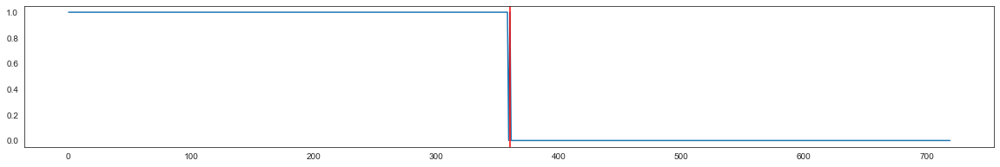

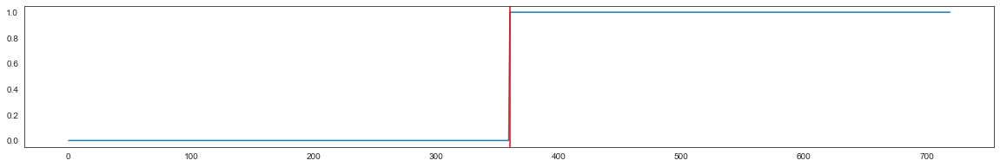

In [94]:
for trigger in trials[0]:
    fig, axs = plt.subplots(1, 1, figsize=(20, 3))
    axs.plot(sync_trace[1,trigger-360:trigger+360])
    axs.axvline(360, c='r')
    plt.show()

In [111]:
from scipy.signal import medfilt
medfilt(sync_trace[1,3430000:3520000], kernel_size=3)
np.diff(np.where(np.diff(medfilt(sync_trace[1,3430000:3520000], kernel_size=3))!=0)[0])

array([ 298, 5702,  300, 5700,  299, 5701,  296, 5704,  299, 5701,  298,
       5702,  296, 5704,  298, 5702,  300, 5700,  296], dtype=int64)

In [57]:
all_trials

[[],
 [801301,
  801303,
  807306,
  813309,
  819311,
  819313,
  825315,
  831319,
  837322,
  843324,
  849324,
  849326],
 [],
 [2121140,
  2127141,
  2133142,
  2139137,
  2145141,
  2151141,
  2157143,
  2163142,
  2163144,
  2169144],
 [2781283,
  2787286,
  2793271,
  2793285,
  2799285,
  2805288,
  2811287,
  2811291,
  2817295,
  2823298,
  2829299,
  2829301]]

In [20]:
def get_ap_analog2(start, end, window):
    # For analog channels: zero-based index of a channel to extract,
    # gain correct and plot (plots first channel only)
    chanList = list(range(0, 374, 1))

    # For a digital channel: zero based index of the digital word in
    # the saved file. For imec data there is never more than one digital word.
    dw = 0

    # Zero-based Line indicies to read from the digital word and plot.
    # For 3B2 imec data: the sync pulse is stored in line 6.
    dLineList = [0, 1, 6]
    # Read in metadata; returns a dictionary with string for values
    meta = readMeta(binFullPath)

    rawData = makeMemMapRaw(binFullPath, meta)

    # parameters common to NI and imec data
    sRate = SampRate(meta)
    firstSamp = start+window[0]
    lastSamp = end+window[1]

    # array of times for plot
    tDat = np.arange(firstSamp, lastSamp+1)
    tDat = 1000*tDat/sRate      # plot time axis in msec

    print(firstSamp, lastSamp)
    selectData = rawData[chanList, firstSamp:lastSamp+1]
    if meta['typeThis'] == 'imec':
        # apply gain correction and convert to uV
        convData = 1e6*GainCorrectIM(selectData, chanList, meta)
    else:
        MN, MA, XA, DW = ChannelCountsNI(meta)
        # print("NI channel counts: %d, %d, %d, %d" % (MN, MA, XA, DW))
        # apply gain coorection and conver to mV
        convData = 1e3*GainCorrectNI(selectData, chanList, meta)

    # Plot the first of the extracted channels
    fig, ax = plt.subplots()
    ax.plot(tDat, convData[0, :])
    plt.show()
    return convData


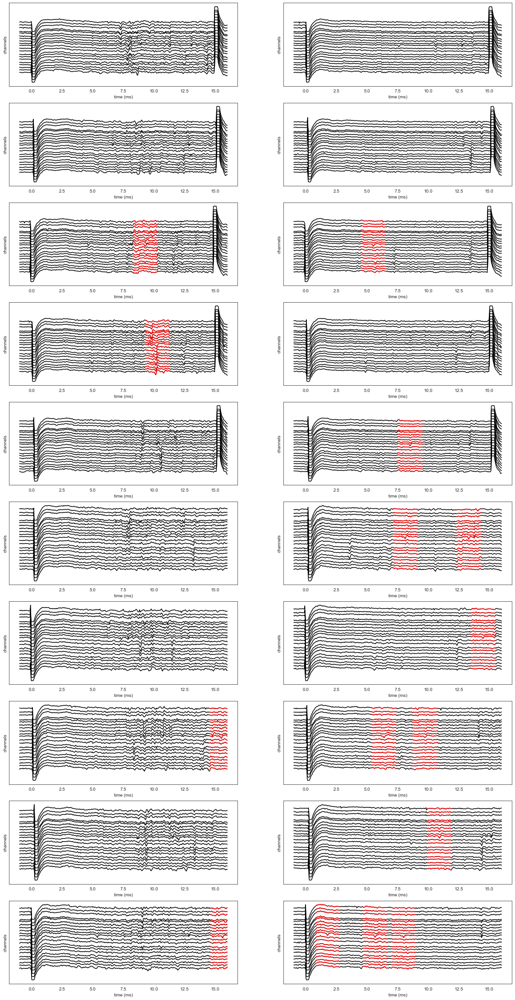

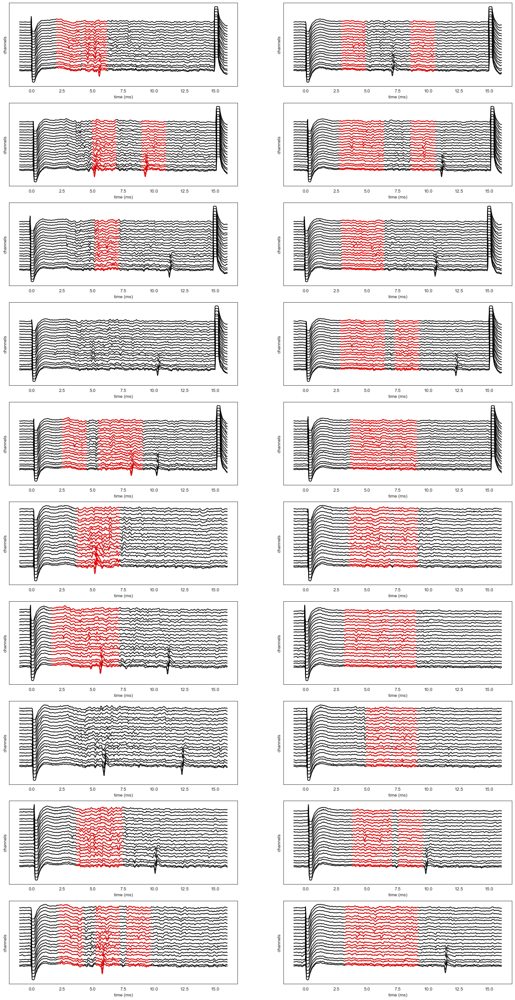

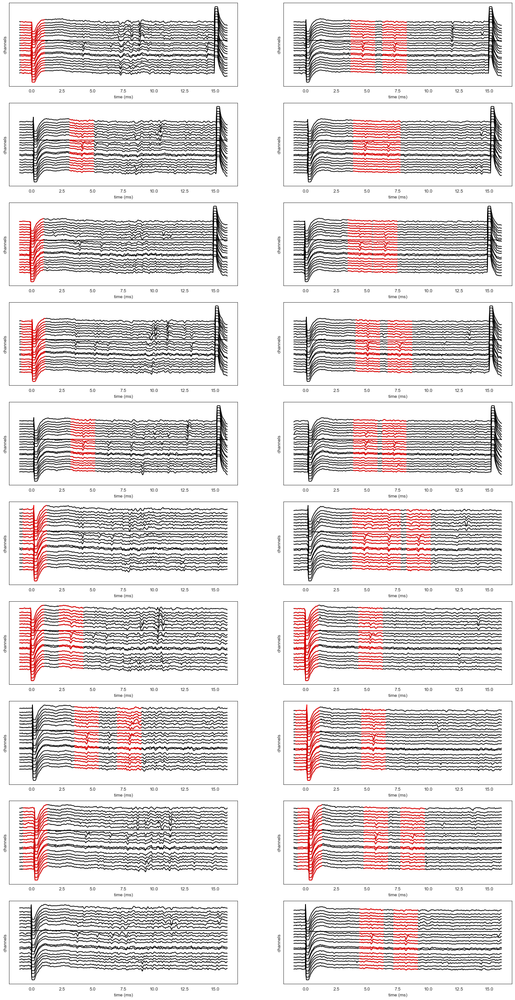

SystemError: <built-in method write of _io.FileIO object at 0x000001AC19264F98> returned a result with an error set

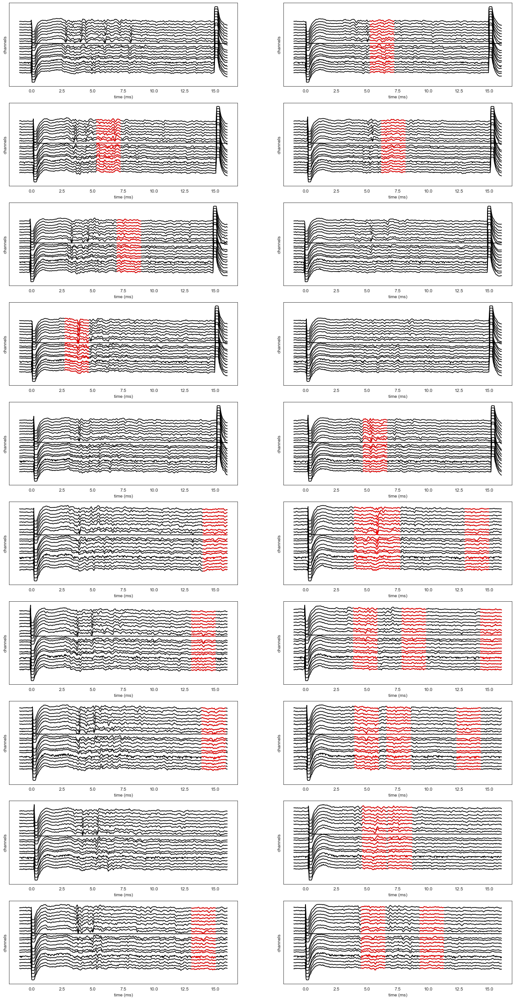

In [29]:
for u_id in opto_units:
    unit_path = os.path.join(figures_folder, f'{u_id}_{int(block.units[u_id].unit_info['depth'])
    os.mkdir(unit_path)
    fig, axs = plt.subplots(10, 2, figsize=(15, 20))
    for idx, (pulse_start, analog) in enumerate(zip(pulse_starts.flatten()[::5], analogs)):
        opto_unit = block.units[u_id]
        u_channel = opto_unit.unit_info['ch']
        u_spikes = block.units[u_id].time_slice(pulse_start/30-1, pulse_start/30+16).views['spikes'].astype('uint32')

        for i, row in enumerate(analog[u_channel-5:u_channel+5,:]):
#             print(i, len(row))
            axs[idx//2,idx%2].plot((np.arange(0, len(row))-30)/30, (row*2+(i*500)), 'k')
            for spike in u_spikes:
#                 print(spike)
                axs[idx//2,idx%2].plot((np.arange(spike-30, min(len(row), spike+30))-30)/30, (row[spike-30:spike+30]*2+(i*500)), 'r')
        #     ax.axvline(18178429-(18178429-30*1), c='k', linewidth=2)
        #     ax.axvline(0, c='k', linewidth=2)
        #     ax.axvline((lastSamp-30-firstSamp-before)/30, c='k', linewidth=2)
            axs[idx//2,idx%2].set(xlabel='time (ms)', ylabel='channels', yticks=[]) # , xlim=[-1, 2]
    plt.savefig(os.path.join(unit_path, f'opto_high_sync_{u_id}.png'), dpi=200)

    plt.show()